# Advanced Lane Finding

In this project, your goal is to write a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car. The camera calibration images, test road images, and project videos are available in the project repository.


## Camera Calibration

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

## Example of finding chessboard corners on a single image

# prepare object points
nx = 9 
ny = 6 

# Make a list of calibration images
fname = 'camera_cal/calibration2.jpg'
img = cv2.imread(fname)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)


In [2]:
import glob

## Determine chessboard corners for all calibration images

# Read in all images in camera_cal folder
images = glob.glob('camera_cal/calibration*.jpg')

# Initialize object and image point arrays
objpoints = []
imgpoints = []
objp = np.zeros((nx*ny, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

for fname in images:
    img = cv2.imread(fname)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    print(fname)
    
    # If found, draw corners
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        # Draw and display the corners
        #cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        #plt.imshow(img)

# Calculate Camera Matrix and Distortion Coefficients
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


camera_cal\calibration1.jpg
camera_cal\calibration10.jpg
camera_cal\calibration11.jpg
camera_cal\calibration12.jpg
camera_cal\calibration13.jpg
camera_cal\calibration14.jpg
camera_cal\calibration15.jpg
camera_cal\calibration16.jpg
camera_cal\calibration17.jpg
camera_cal\calibration18.jpg
camera_cal\calibration19.jpg
camera_cal\calibration2.jpg
camera_cal\calibration20.jpg
camera_cal\calibration3.jpg
camera_cal\calibration4.jpg
camera_cal\calibration5.jpg
camera_cal\calibration6.jpg
camera_cal\calibration7.jpg
camera_cal\calibration8.jpg
camera_cal\calibration9.jpg


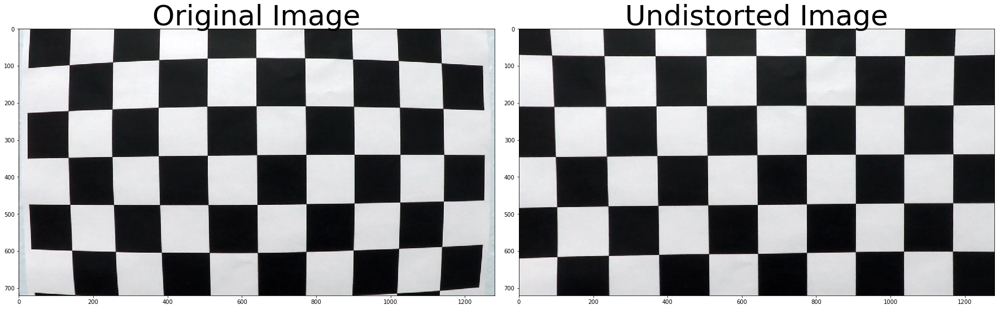

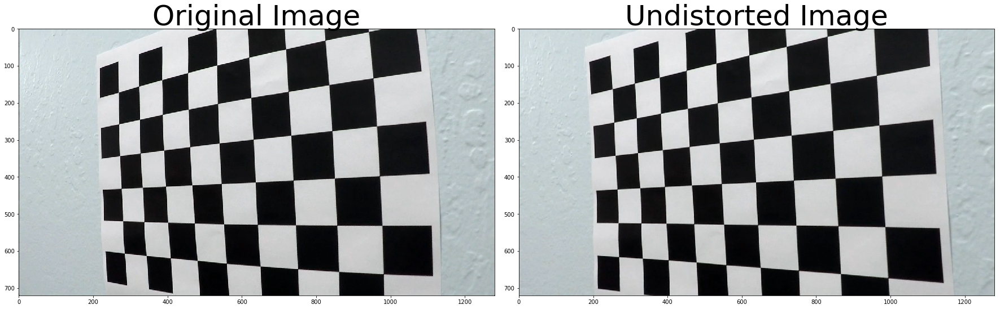

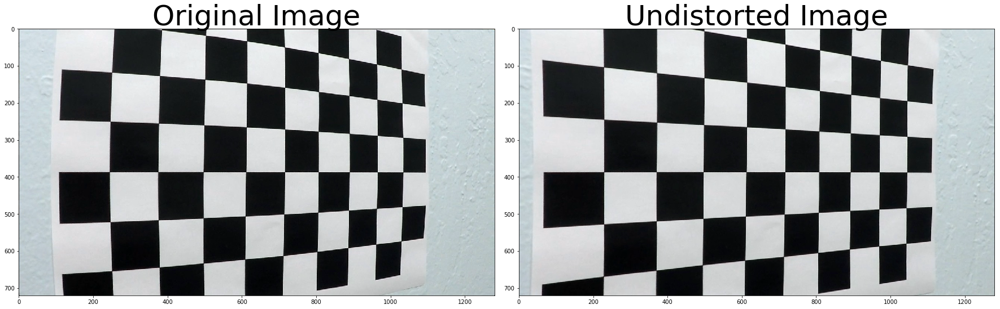

In [3]:
# Verify Camera Matrix and Distortion Coefficients

for i in (1,4,5):
    fname = 'camera_cal/calibration{}.jpg'.format(i)

    img = cv2.imread(fname)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

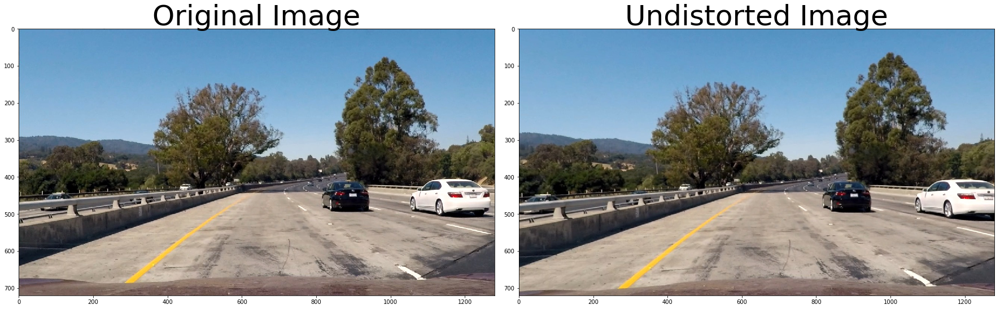

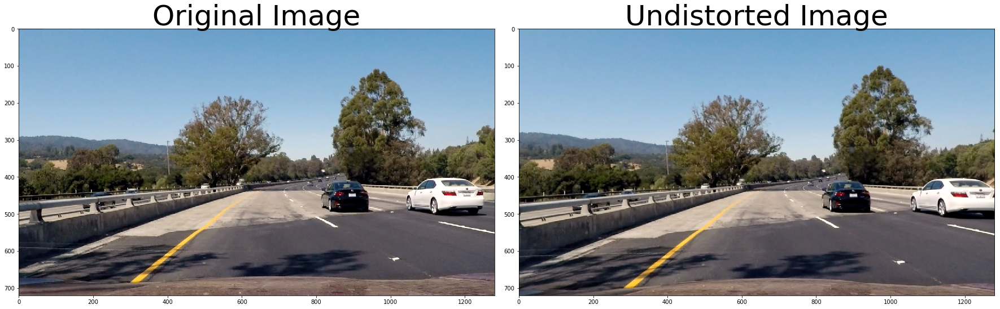

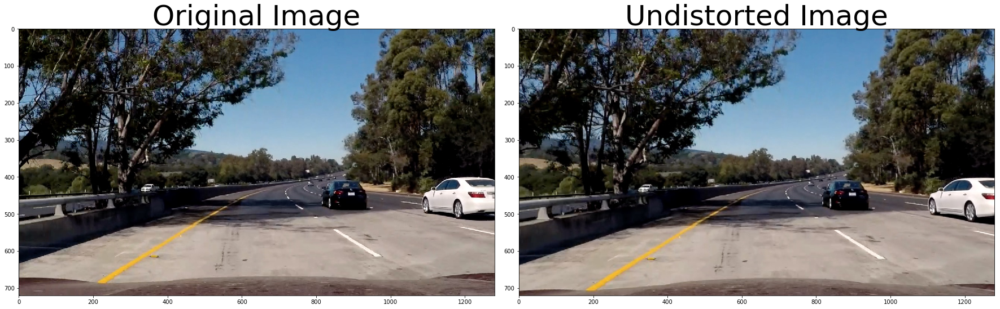

In [4]:
# Apply Camera Matrix and Distortion Coefficients to an example lane image

for i in (1,4,5):
    fname = 'test_images/test{}.jpg'.format(i)

    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [5]:
# Utility function to load, convert to RGB, and undistort images
def loadImage(fname, mtx, dist):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.undistort(img, mtx, dist, None, mtx)
    return img

## Create binary lane image pipeline
 Apply color transforms, gradients, and thresholding to distinguish lane lines

In [6]:
# Sobel binary function from lesson
def abs_sobel_thresh(img, orient='x', thresh=(0, 255), sobel_kernel=3):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return sbinary

# Magnitude threshold from lesson
def mag_thresh(img, thresh=(0, 255), sobel_kernel=3):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Calculate the magnitude 
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    # 5) Create a binary mask where mag thresholds are met
    # 6) Return this mask as your binary_output image

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobel = np.sqrt(sobelx**2+sobely**2)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sbinary

# Gradient Direction threshold from lesson
def dir_thresh(img, thresh=(0, np.pi/2), sobel_kernel=3):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    # 6) Return this mask as your binary_output image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = np.abs(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    sobely = np.abs(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    arct_sobel = np.arctan2(sobely, sobelx)
    dbinary = np.zeros_like(arct_sobel)
    dbinary[(arct_sobel >= thresh[0]) & (arct_sobel <= thresh[1])] = 1
    return dbinary

def hls_thresh(img, channel='S', thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if channel=='H':
        hls = hls[:,:,0]
    elif channel=='H':
        hls = hls[:,:,1]
    else:
        hls = hls[:,:,2]

    binary = np.zeros_like(hls)
    binary[(hls > thresh[0]) & (hls <= thresh[1])] = 1
    return binary

def hsv_thresh(img, channel='S', thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if channel=='H':
        hls = hls[:,:,0]
    elif channel=='S':
        hls = hls[:,:,1]
    else:
        hls = hls[:,:,2]

    binary = np.zeros_like(hls)
    binary[(hls > thresh[0]) & (hls <= thresh[1])] = 1
    return binary

def rgb_thresh(img, channel='R', thresh=(0, 255)):
    if channel=='R':
        img = img[:,:,0]
    elif channel=='G':
        img = img[:,:,1]
    else:
        img = img[:,:,2]

    binary = np.zeros_like(img)
    binary[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary

### Combine various threshold methods into a single binary image

In [7]:
def binary_image(image):
    
    ksize = 3
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', thresh=(50, 255), sobel_kernel=ksize)
    grady = abs_sobel_thresh(image, orient='y', thresh=(0, 150), sobel_kernel=ksize)
    mag_binary = mag_thresh(image, thresh=(25, 255), sobel_kernel=ksize)
    dir_margin = 0.6
    dir_binary = dir_thresh(image, thresh=(-np.pi/2*dir_margin, np.pi/2*dir_margin), sobel_kernel=ksize)
    s_binary = hls_thresh(image, channel='S', thresh=(100,255))
    v_binary = hsv_thresh(image, channel='V', thresh=(75,255))
    rgb_binary = rgb_thresh(image, channel='R', thresh=(255,255))

    combined = np.zeros_like(dir_binary)
    combined[(
              ((gradx == 1) & (grady == 1)) |
              ((mag_binary == 1) & (dir_binary == 1)) | #& ((hls_binary_low == 1))) |
              ((s_binary == 1) & (v_binary == 1))
             )] = 1
    
    return combined



## Perspective Transform

In [8]:
def birdseye(img, offset=300):
    # Hard-coded points based on straight line image
    src = np.float32([[590,450],[686,450],[1050,675],[255,675]])
    dst = np.float32([[offset,0],[img.shape[1]-offset,0],[img.shape[1]-offset,img.shape[0]],[offset,img.shape[0]]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)
    return warped, Minv

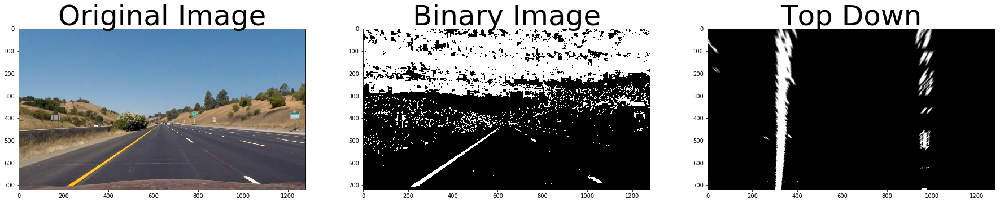

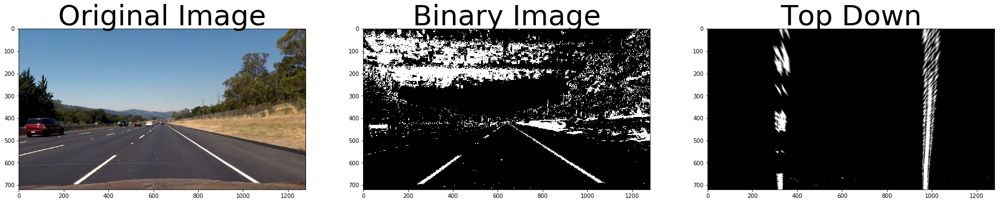

In [9]:
# Test binary thresholding and perpective transform on straight lines to verify birdseye function
for i in range(1,3):
    fname = 'test_images/straight_lines{}.jpg'.format(i)
    undist = loadImage(fname, mtx, dist)
    binary = binary_image(undist)
    lanes, Minv = birdseye(binary)

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    ax1.imshow(undist)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(binary, cmap='gray')
    ax2.set_title('Binary Image', fontsize=50)
    ax3.imshow(lanes, cmap='gray')
    ax3.set_title('Top Down', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

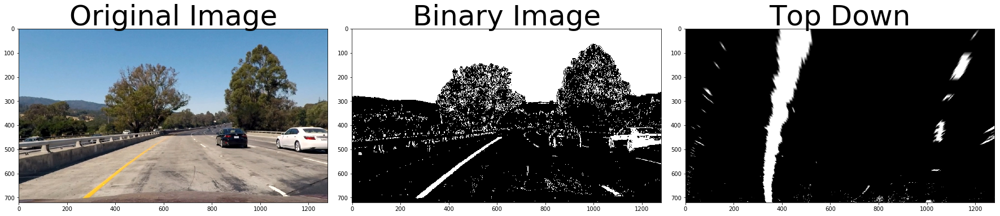

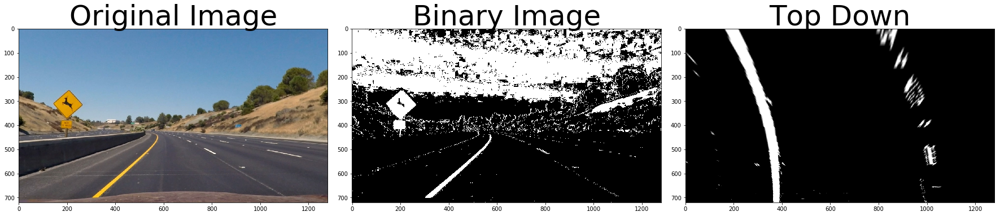

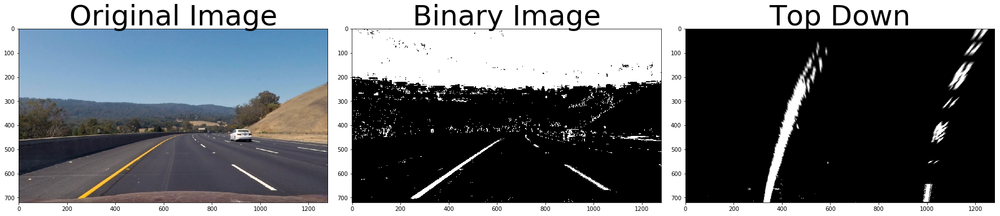

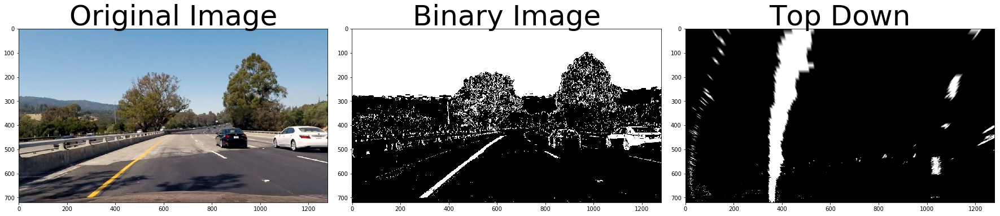

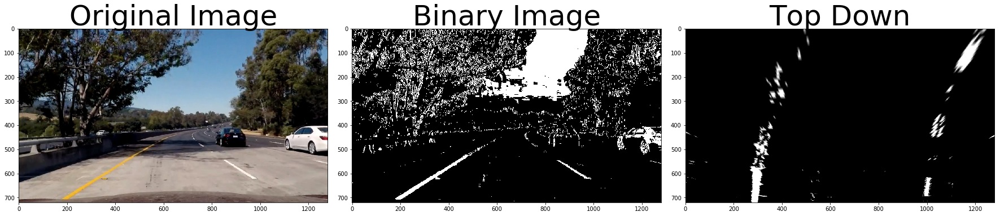

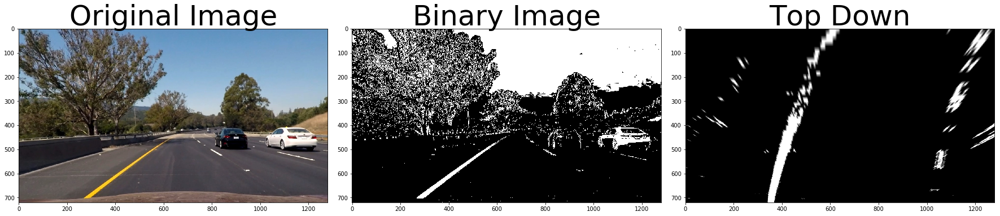

In [10]:
# Test binary thresholding and perpective transform on straight lines to verify birdseye function
for i in range(1,7):
    fname = 'test_images/test{}.jpg'.format(i)
    undist = loadImage(fname, mtx, dist)
    binary = binary_image(undist)
    lanes, Minv = birdseye(binary)

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(undist)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(binary, cmap='gray')
    ax2.set_title('Binary Image', fontsize=50)
    ax3.imshow(lanes, cmap='gray')
    ax3.set_title('Top Down', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Find Lane Lines
Find line in the transformed binary image using sliding window search and calculate second order polyfit.

In [11]:
# Line class from project tips lesson
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = np.array([]).reshape(0,720)
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = (0,0,0) 
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        self.fits = np.array([[0,0,0]]) 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        #Because I gave up
        self.counter = 0

In [12]:
## Sliding Window search from lesson

def slidingWindowLines(binary_warped, left_line, right_line, nwindows=9, margin=100, minpix=50, plots=False):
    # binary_warped: Birdseye view binary image of lane lines
    # nwindows: Number of windows in sliding window search
    # margin: Window width in pixels
    # minpix: Minimum number of pixels to shift the window center
    # plots: Whether or not to plot the lane search window and lines

    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    
    if plots:
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        if plots:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,1,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,1,0), 2) 
            
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    left_line.allx = leftx
    left_line.ally = lefty
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    right_line.allx = rightx
    right_line.ally = righty
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    left_line.best_fit = left_fit
    right_line.best_fit = right_fit
    
    if plots:
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [1, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 1]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        
    return left_line, right_line

In [13]:
## Targetted search around polyfit from lesson

def targetedLines(binary_warped, left_line, right_line, margin = 100, minpix=5000, plots=False):
    # binary_warped: Birdseye view binary image of lane lines
    # nwindows: Number of windows in sliding window search
    # margin: Window width in pixels
    # minpix: Minimum number of pixels to shift the window center
    # plots: Whether or not to plot the lane search window and lines

    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    left_fit = left_line.best_fit
    right_fit = right_line.best_fit
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    if (right_lane_inds.nonzero()[0].shape[0]>minpix) & (left_lane_inds.nonzero()[0].shape[0]>minpix):
        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        left_line.best_fit = left_fit
        right_line.best_fit = right_fit
        
        right_line.allx = rightx
        right_line.ally = righty
        left_line.allx = leftx
        left_line.ally = lefty
    else:
        left_line, right_line = slidingWindowLines(binary_warped, left_line, right_line, nwindows=9, margin=margin, minpix=50, plots=False)
        left_fit = left_line.best_fit 
        right_fit = right_line.best_fit
    
    if plots:
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [1, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 1]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                      ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                      ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,1, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,1, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        
    return left_line, right_line

Image 1 Curvature: 2307.005548160025
Image 1 Offset: 0.10909405018629267
Image 2 Curvature: 3250.461748289311
Image 2 Offset: 0.26443836532018905
Image 3 Curvature: 1960.021507108261
Image 3 Offset: 0.12996674024055987
Image 4 Curvature: 1929.7194841569403
Image 4 Offset: 0.2440530812010649
Image 5 Curvature: 3149.300499708084
Image 5 Offset: 0.0410433938775113


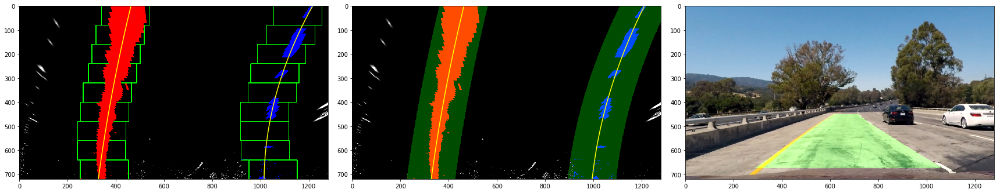

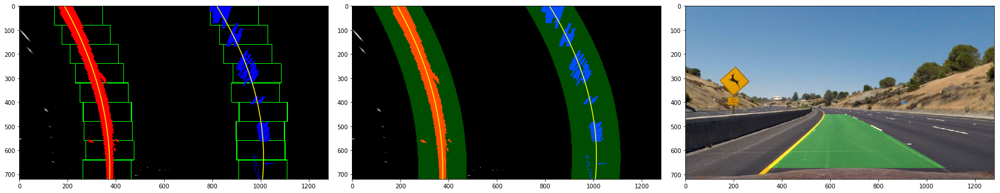

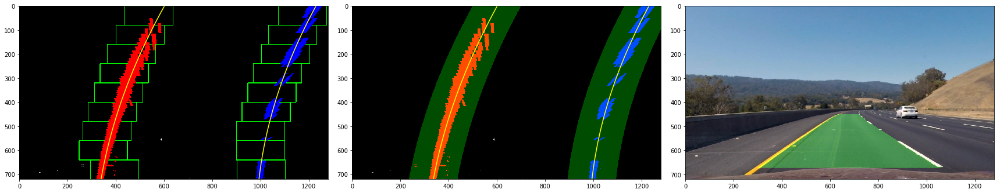

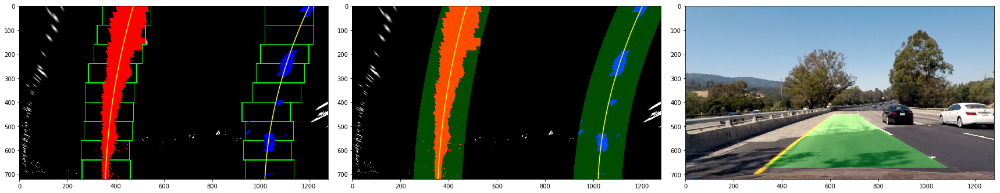

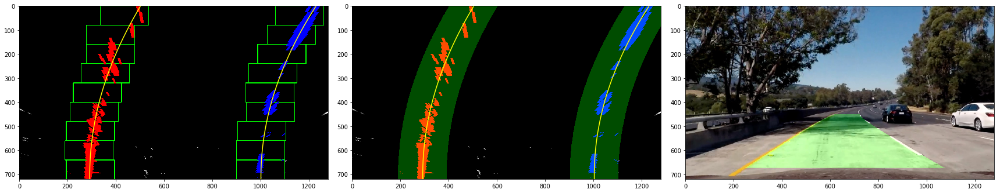

In [14]:
# Test Lane Finding, Curvature, and Painting
numTestImages = 5
for i in range(1,numTestImages+1):
    fname = 'test_images/test{}.jpg'.format(i)
    undist = loadImage(fname, mtx, dist)
    binary = binary_image(undist)
    lanes, Minv = birdseye(binary)
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    
    left_line = Line()
    right_line = Line()
    
    plt.axes(ax1)
    left_line, right_line = slidingWindowLines(lanes, left_line, right_line, nwindows=9, margin=100, minpix=50, plots=True)
    
    plt.axes(ax2)
    right_line, left_line = targetedLines(lanes, left_line, right_line, margin = 100, minpix=5000, plots=True)
    
    left_fit = left_line.best_fit
    right_fit = right_line.best_fit   
    
    plt.axes(ax3)
    ploty = np.linspace(0, lanes.shape[0]-1, lanes.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Lane Drawing from Udactiy project tips lesson
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(lanes).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    plt.imshow(result)
    
    # Curvature
    mx = 3.7/720. 
    my = 30./700.
    a = mx / (my**2.) * left_fit[0] 
    b = (mx / my) * left_fit[1]
    curvature_left = (1.+(2.*a*undist.shape[0]+b)**2.)**(3./2.)/np.abs(2.*a)
    a = mx / (my**2.) * right_fit[0] 
    b = (mx / my) * right_fit[1]
    curvature_right = (1.+(2.*a*undist.shape[0]+b)**2.)**(3./2.)/np.abs(2.*a)
    print('Image {} Curvature: {}'.format(i,(curvature_left+curvature_right)/2))
    
    #Offset
    left_fit_bottom = left_fit[0]*undist.shape[0]**2 + left_fit[1]*undist.shape[0] + left_fit[2]
    right_fit_bottom = right_fit[0]*undist.shape[0]**2 + right_fit[1]*undist.shape[0] + right_fit[2]
    offset = mx*((left_fit_bottom + right_fit_bottom) / 2. - undist.shape[1] / 2.)
    print('Image {} Offset: {}'.format(i, offset))


## Apply Lane Finding Pipeline to Video
Video Processing Method taken from Udacity SDC-ND Project 1

In [15]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [16]:
#fl_imgage workaround from https://github.com/Zulko/moviepy/issues/159
def process_video(clip, mtx, dist, left_line = Line(), right_line = Line()):
    def process_image(input_image):
        img = cv2.undistort(input_image, mtx, dist, None, mtx)
        binary = binary_image(img)
        lanes, Minv = birdseye(binary)

        #left_fit, right_fit = slidingWindowLines(lanes, nwindows=9, margin=100, minpix=50, plots=False)
        
        left_line1, right_line1 = targetedLines(lanes, left_line, right_line, margin = 100, minpix=5000, plots=False)
        
        #Update line tracking
        left_fit = left_line1.best_fit
        right_fit = right_line1.best_fit
        left_line.diffs = left_line.current_fit - left_fit
        right_line.diffs = right_line.current_fit - right_fit
        left_line.current_fit = left_fit
        right_line.current_fit = right_fit
        
        # Store and average last n fits
        n = 5
        left_line.fits = np.append(left_line.fits, [left_fit], 0)
        right_line.fits = np.append(right_line.fits, [right_fit], 0)
        
        left_line.counter += 1
        if (left_line.counter>n) | (left_line.counter==1):
            left_line.fits = np.delete(left_line.fits, 0, 0)
            right_line.fits = np.delete(right_line.fits, 0, 0)
        left_fit = np.mean(left_line.fits, axis=0)
        right_fit = np.mean(right_line.fits, axis=0)
        
        # Calculate best fit for plotting 
        ploty = np.linspace(0, lanes.shape[0]-1, lanes.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        left_line.best_fit = left_fit
        right_line.best_fit = right_fit
                
        # Lane Drawing from Udactiy project tips lesson
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(lanes).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        color_warp[left_line1.ally, left_line1.allx] = [255, 0, 0]
        color_warp[right_line1.ally, right_line1.allx] = [0, 0, 255]
        
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)

        # Curvature
        mx = 3.7/720. 
        my = 30./700.
        a = mx / (my**2.) * left_fit[0] 
        b = (mx / my) * left_fit[1]
        left_line.radius_of_curvature = (1.+(2.*a*img.shape[0]+b)**2.)**(3./2.)/np.abs(2.*a)
        a = mx / (my**2.) * right_fit[0] 
        b = (mx / my) * right_fit[1]
        right_line.radius_of_curvature = (1.+(2.*a*img.shape[0]+b)**2.)**(3./2.)/np.abs(2.*a)
        curvature = (left_line.radius_of_curvature+right_line.radius_of_curvature)/2
        curvature_text = ('Curvature: {:.3}km').format(curvature/1000.)
        result = cv2.putText(result, curvature_text, (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255))
        
        #Offset
        left_line.line_base_pos = left_fit[0]*img.shape[0]**2 + left_fit[1]*img.shape[0] + left_fit[2]
        right_line.line_base_pos = right_fit[0]*img.shape[0]**2 + right_fit[1]*img.shape[0] + right_fit[2]
        offset = mx*((left_line.line_base_pos + right_line.line_base_pos) / 2. - img.shape[1] / 2.)
        offset_text = ('Offset: {:.3}m').format(offset)
        result = cv2.putText(result, offset_text, (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (255, 255, 255))
        
        return result
    return clip.fl(lambda gf, t: process_image(gf(t)), apply_to=[])


In [17]:
output_video = 'project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("project_video.mp4").subclip(20,25)
clip1 = VideoFileClip("project_video.mp4")
output_clip = process_video(clip1, mtx, dist) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output_video, audio=False)
del clip1.reader
del clip1
del output_clip.reader
del output_clip

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [09:22<00:00,  2.25it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 9min 25s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.


In [18]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))

In [19]:
output_video = 'challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("challenge_video.mp4").subclip(20,25)
clip1 = VideoFileClip("challenge_video.mp4")
output_clip = process_video(clip1, mtx, dist) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output_video, audio=False)
del clip1.reader
del clip1
del output_clip.reader
del output_clip

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████████████████████████████████████████████████████████████████████████| 485/485 [5:17:16<00:00,  3.43it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

Wall time: 5h 17min 17s


In [20]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))

In [21]:
output_video = 'harder_challenge_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
#clip1 = VideoFileClip("challenge_video.mp4").subclip(20,25)
clip1 = VideoFileClip("harder_challenge_video.mp4")
output_clip = process_video(clip1, mtx, dist) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output_video, audio=False)
del clip1.reader
del clip1
del output_clip.reader
del output_clip

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [06:29<00:00,  3.39it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

Wall time: 6min 31s


In [22]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))